In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")


# importing libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score

In [37]:
df = pd.read_csv(r"C:/Users/user/Desktop/Datasets/Hotel Reservations.csv")

In [38]:
df

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,INN36271,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled
36271,INN36272,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled
36272,INN36273,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled
36273,INN36274,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled


In [7]:
df.isnull().sum()

Booking_ID                              0
no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

In [6]:
df.duplicated().sum()

0

In [7]:
df.describe()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
count,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000
mean,1.844962,0.105279,0.810724,2.204300,0.030986,85.232557,2017.820427,7.423653,15.596995,0.025637,0.023349,0.153411,103.423539,0.619655
std,0.518715,0.402648,0.870644,1.410905,0.173281,85.930817,0.383836,3.069894,8.740447,0.158053,0.368331,1.754171,35.089424,0.786236
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,1.000000,0.000000,17.000000,2018.000000,5.000000,8.000000,0.000000,0.000000,0.000000,80.300000,0.000000
50%,2.000000,0.000000,1.000000,2.000000,0.000000,57.000000,2018.000000,8.000000,16.000000,0.000000,0.000000,0.000000,99.450000,0.000000
75%,2.000000,0.000000,2.000000,3.000000,0.000000,126.000000,2018.000000,10.000000,23.000000,0.000000,0.000000,0.000000,120.000000,1.000000
max,4.000000,10.000000,7.000000,17.000000,1.000000,443.000000,2018.000000,12.000000,31.000000,1.000000,13.000000,58.000000,540.000000,5.000000


In [8]:
df.dtypes

Booking_ID                               object
no_of_adults                              int64
no_of_children                            int64
no_of_weekend_nights                      int64
no_of_week_nights                         int64
type_of_meal_plan                        object
required_car_parking_space                int64
room_type_reserved                       object
lead_time                                 int64
arrival_year                              int64
arrival_month                             int64
arrival_date                              int64
market_segment_type                      object
repeated_guest                            int64
no_of_previous_cancellations              int64
no_of_previous_bookings_not_canceled      int64
avg_price_per_room                      float64
no_of_special_requests                    int64
booking_status                           object
dtype: object

In [46]:
!pip install ydata-profiling

In [47]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title='Data Profile Report')

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
# Checking the uniqueness of each column
unique_values_per_column = df.nunique()

unique_values_per_column


Booking_ID                              36275
no_of_adults                                5
no_of_children                              6
no_of_weekend_nights                        8
no_of_week_nights                          18
type_of_meal_plan                           4
required_car_parking_space                  2
room_type_reserved                          7
lead_time                                 352
arrival_year                                2
arrival_month                              12
arrival_date                               31
market_segment_type                         5
repeated_guest                              2
no_of_previous_cancellations                9
no_of_previous_bookings_not_canceled       59
avg_price_per_room                       3930
no_of_special_requests                      6
booking_status                              2
dtype: int64

In [10]:
# Getting the shape of the dataset
df.shape

(36275, 19)

In [11]:
# Describing the categorical data
categorical_columns = df.select_dtypes(include=['object']).columns
categorical_data_description = df[categorical_columns].describe()

categorical_data_description


,Booking_ID,type_of_meal_plan,room_type_reserved,market_segment_type,booking_status
count,36275,36275,36275,36275,36275
unique,36275,4,7,5,2
top,INN00001,Meal Plan 1,Room_Type 1,Online,Not_Canceled
freq,1,27835,28130,23214,24390


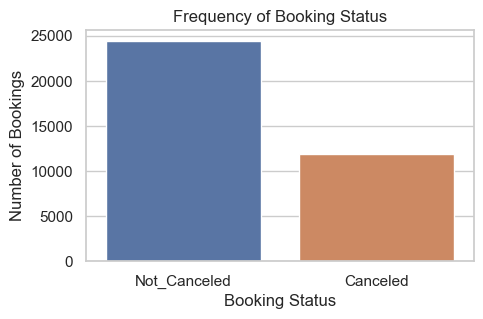

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the aesthetic style of the plots
sns.set(style="whitegrid")

# Chart for Booking Status
plt.figure(figsize=(5, 3))
sns.countplot(x='booking_status', data=df)
plt.title('Frequency of Booking Status')
plt.ylabel('Number of Bookings')
plt.xlabel('Booking Status')
plt.show()

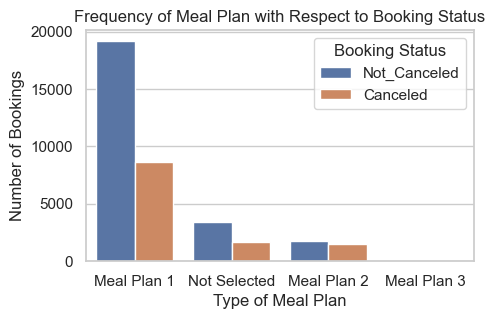

In [13]:
# Chart for Frequency of Meal Plan with respect to Booking Status
plt.figure(figsize=(5, 3))
sns.countplot(x='type_of_meal_plan', hue='booking_status', data=df)
plt.title('Frequency of Meal Plan with Respect to Booking Status')
plt.ylabel('Number of Bookings')
plt.xlabel('Type of Meal Plan')
plt.legend(title='Booking Status')
plt.show()

In [14]:
# Creating a table for Market Segment Type with respect to Booking Status
market_segment_booking_status = pd.crosstab(df['market_segment_type'], df['booking_status'])

market_segment_booking_status

booking_status,Canceled,Not_Canceled
market_segment_type,,
Aviation,37,88
Complementary,0,391
Corporate,220,1797
Offline,3153,7375
Online,8475,14739


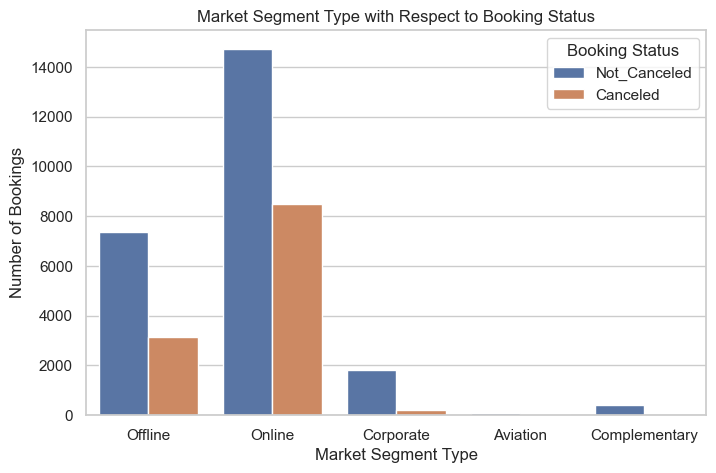

In [15]:
# Chart for Market Segment Type with respect to Booking Status
plt.figure(figsize=(8, 5))
sns.countplot(x='market_segment_type', hue='booking_status', data=df)
plt.title('Market Segment Type with Respect to Booking Status')
plt.ylabel('Number of Bookings')
plt.xlabel('Market Segment Type')
plt.legend(title='Booking Status')
plt.show()

In [16]:
import pandas as pd

# Grouping by 'room_type_reserved' and calculating the lead time statistics
lead_time_stats = df.groupby('room_type_reserved')['lead_time'].agg(['mean', 'median', 'std']).reset_index()

# Renaming the columns for clarity
lead_time_stats = lead_time_stats.rename(columns={'mean': 'Average Lead Time', 
                                                  'median': 'Median Lead Time', 
                                                  'std': 'Lead Time Standard Deviation'})

# Displaying the table
print(lead_time_stats)

  room_type_reserved  Average Lead Time  Median Lead Time  \
0        Room_Type 1          89.642943              59.0   
1        Room_Type 2         101.021676              75.0   
2        Room_Type 3          69.571429              66.0   
3        Room_Type 4          69.205712              55.0   
4        Room_Type 5          59.547170              32.0   
5        Room_Type 6          61.015528              38.0   
6        Room_Type 7          37.094937              20.5   

   Lead Time Standard Deviation  
0                     90.860265  
1                     85.377079  
2                     70.056780  
3                     59.718577  
4                     70.581182  
5                     64.116238  
6                     43.630292  


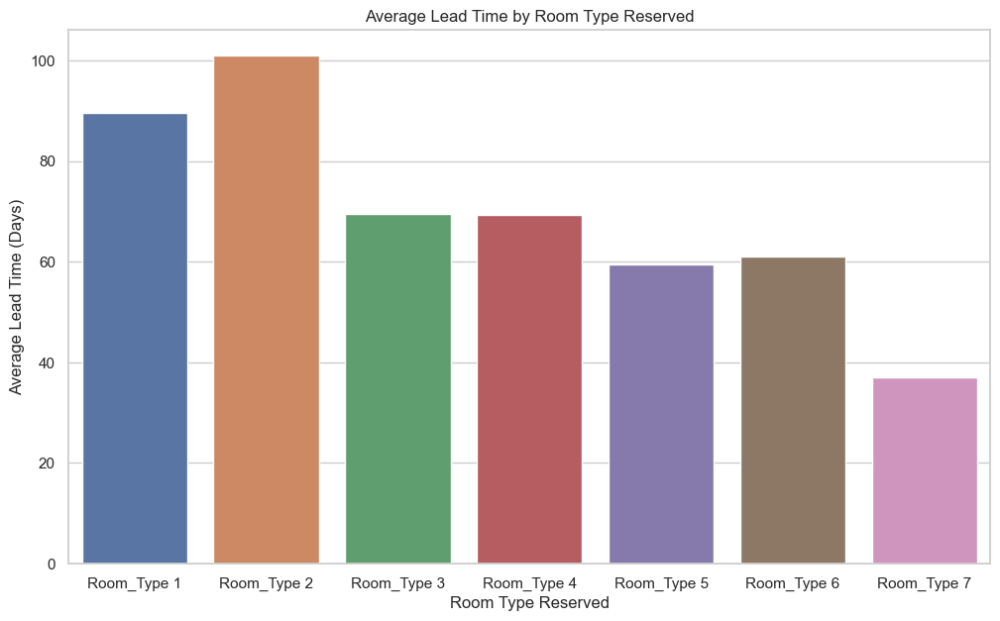

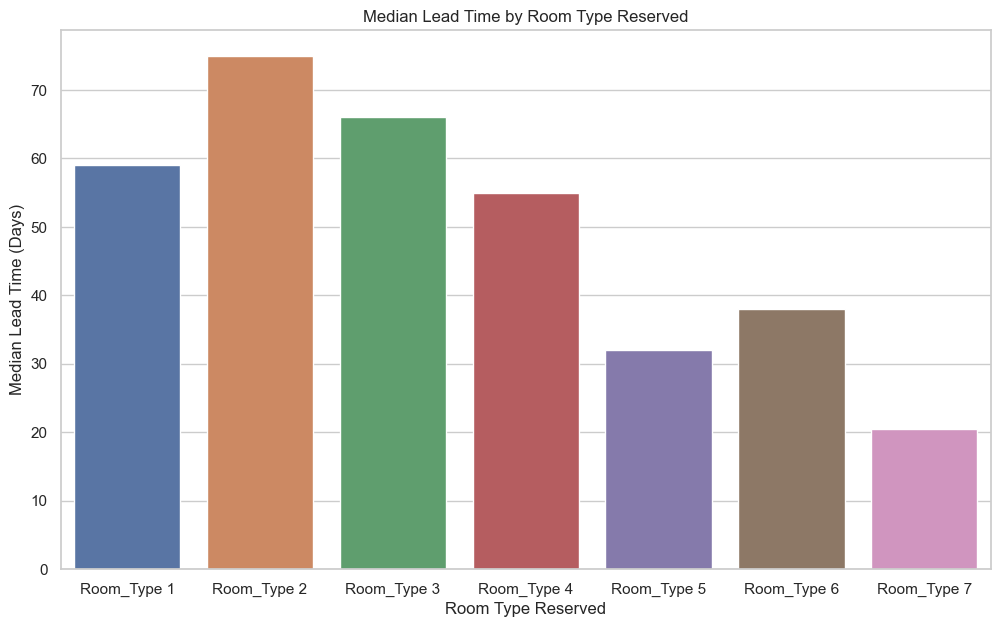

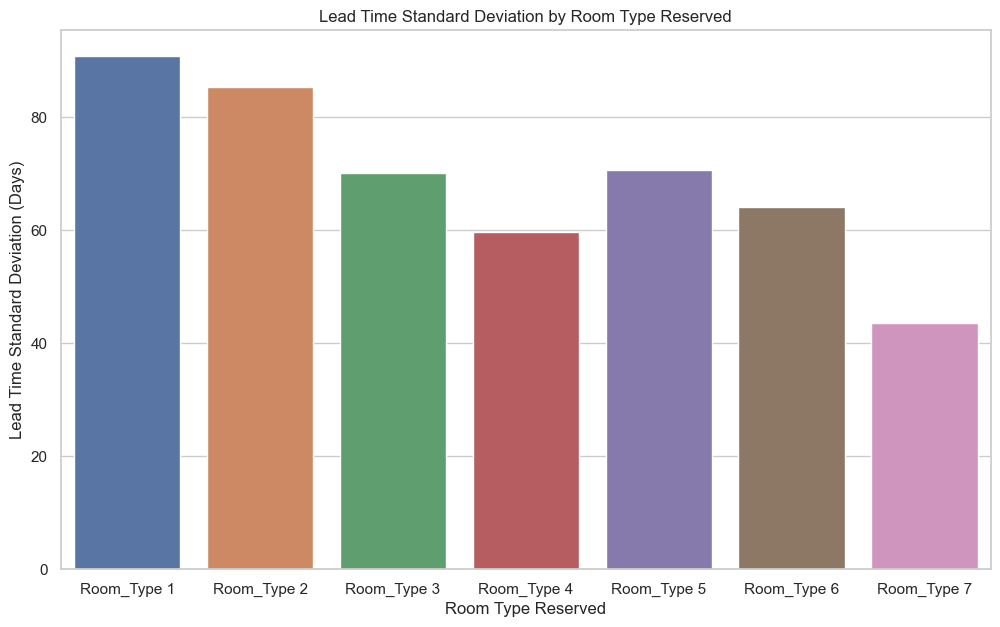

In [17]:
# Calculating average, median, and standard deviation of lead time for each room type
lead_time_stats = df.groupby('room_type_reserved')['lead_time'].agg(['mean', 'median', 'std']).reset_index()

# Displaying the table
lead_time_stats_table = lead_time_stats.rename(columns={'mean': 'Average Lead Time', 'median': 'Median Lead Time', 'std': 'Lead Time Standard Deviation'})
lead_time_stats_table

# Creating a chart
plt.figure(figsize=(12, 7))
sns.barplot(x='room_type_reserved', y='mean', data=lead_time_stats)
plt.title('Average Lead Time by Room Type Reserved')
plt.ylabel('Average Lead Time (Days)')
plt.xlabel('Room Type Reserved')
plt.show()

plt.figure(figsize=(12, 7))
sns.barplot(x='room_type_reserved', y='median', data=lead_time_stats)
plt.title('Median Lead Time by Room Type Reserved')
plt.ylabel('Median Lead Time (Days)')
plt.xlabel('Room Type Reserved')
plt.show()

plt.figure(figsize=(12, 7))
sns.barplot(x='room_type_reserved', y='std', data=lead_time_stats)
plt.title('Lead Time Standard Deviation by Room Type Reserved')
plt.ylabel('Lead Time Standard Deviation (Days)')
plt.xlabel('Room Type Reserved')
plt.show()


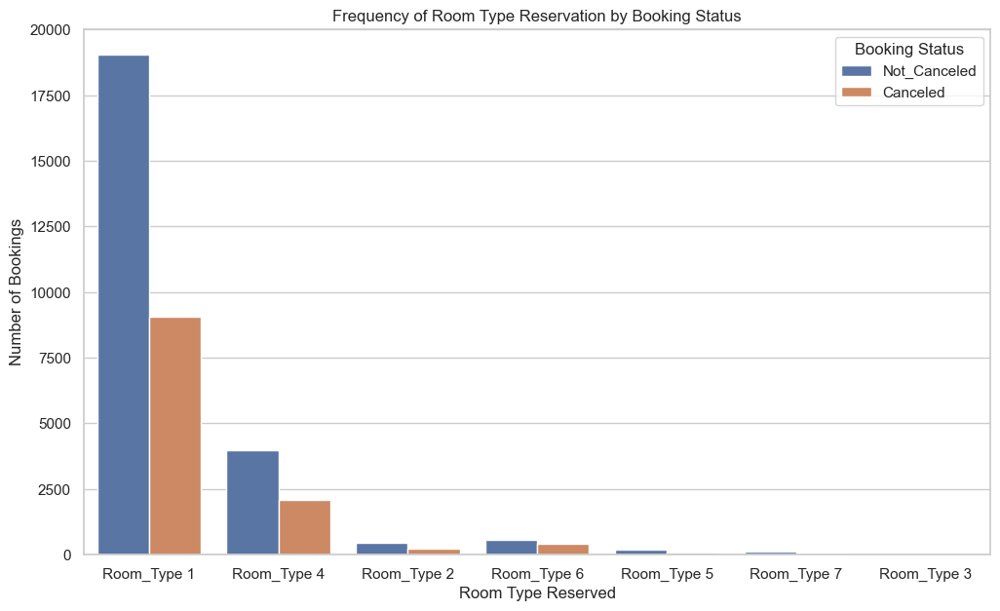

In [18]:
# Creating a chart for Frequency of Room Type Reservation by Booking Status
plt.figure(figsize=(12, 7))
sns.countplot(x='room_type_reserved', hue='booking_status', data=df)
plt.title('Frequency of Room Type Reservation by Booking Status')
plt.ylabel('Number of Bookings')
plt.xlabel('Room Type Reserved')
plt.legend(title='Booking Status')
plt.show()

In [19]:
import pandas as pd

# Select only the numeric columns from the DataFrame
numeric_columns = df.select_dtypes(include=['int64', 'float64'])

# Using the describe() method to get the summary statistics
numeric_data_description = numeric_columns.describe()

# To display the table in a transposed format (optional)
numeric_data_description = numeric_data_description.transpose()

# Printing the table
print(numeric_data_description)


                                        count         mean        std     min  \
no_of_adults                          36275.0     1.844962   0.518715     0.0   
no_of_children                        36275.0     0.105279   0.402648     0.0   
no_of_weekend_nights                  36275.0     0.810724   0.870644     0.0   
no_of_week_nights                     36275.0     2.204300   1.410905     0.0   
required_car_parking_space            36275.0     0.030986   0.173281     0.0   
lead_time                             36275.0    85.232557  85.930817     0.0   
arrival_year                          36275.0  2017.820427   0.383836  2017.0   
arrival_month                         36275.0     7.423653   3.069894     1.0   
arrival_date                          36275.0    15.596995   8.740447     1.0   
repeated_guest                        36275.0     0.025637   0.158053     0.0   
no_of_previous_cancellations          36275.0     0.023349   0.368331     0.0   
no_of_previous_bookings_not_

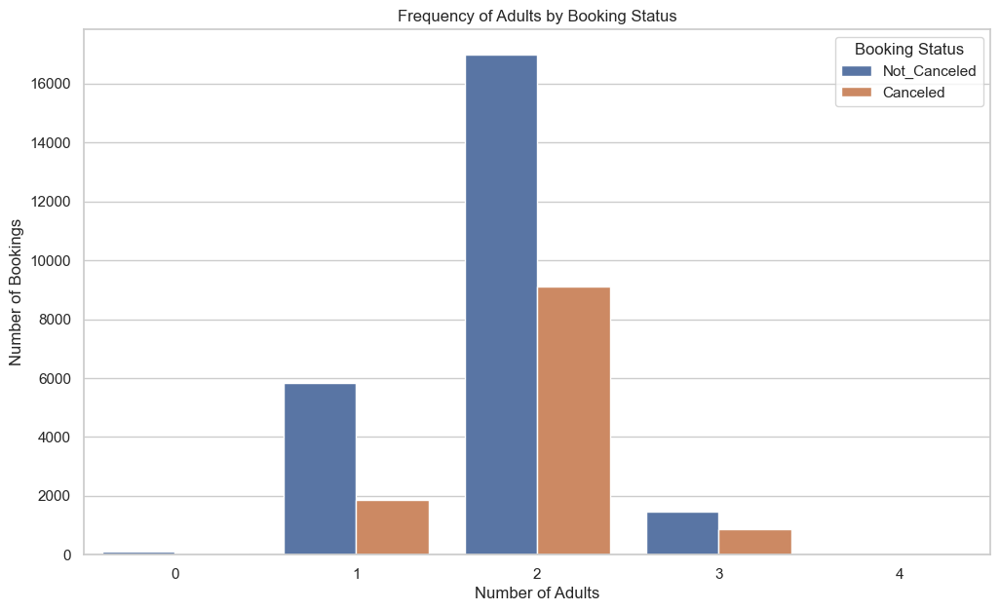

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming hotel_data_cleaned is your DataFrame
plt.figure(figsize=(12, 7))
sns.countplot(x='no_of_adults', hue='booking_status', data=df)
plt.title('Frequency of Adults by Booking Status')
plt.ylabel('Number of Bookings')
plt.xlabel('Number of Adults')
plt.legend(title='Booking Status')
plt.show()

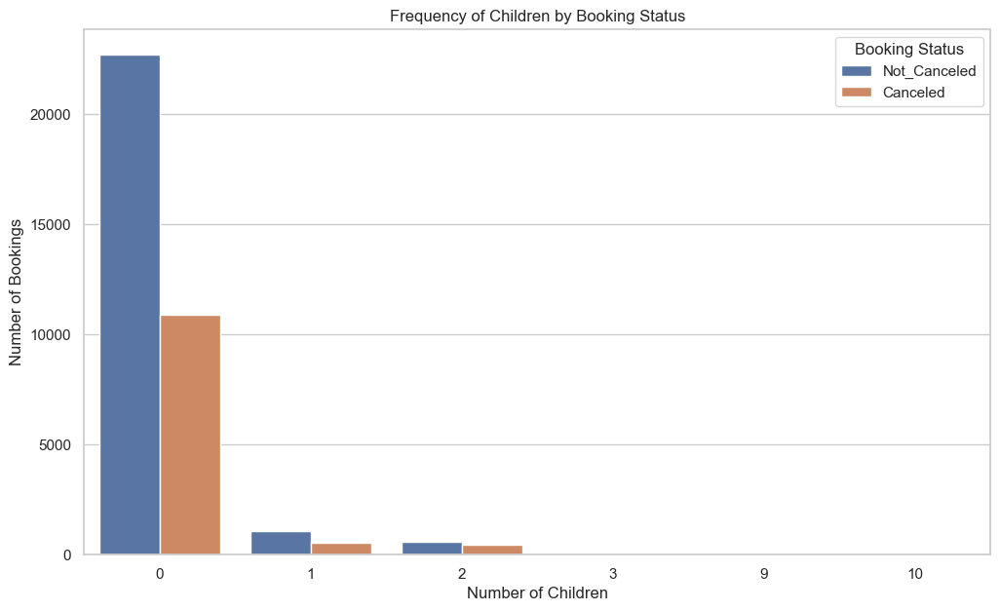

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 7))
sns.countplot(x='no_of_children', hue='booking_status', data=df)
plt.title('Frequency of Children by Booking Status')
plt.ylabel('Number of Bookings')
plt.xlabel('Number of Children')
plt.legend(title='Booking Status')
plt.show()

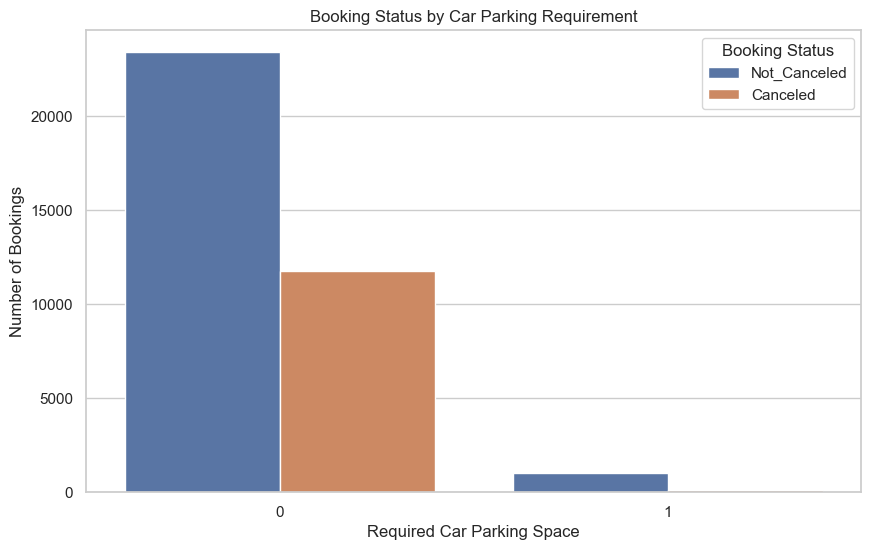

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Booking Status by Car Parking Requirement
plt.figure(figsize=(10, 6))
sns.countplot(x='required_car_parking_space', hue='booking_status', data=df)
plt.title('Booking Status by Car Parking Requirement')
plt.ylabel('Number of Bookings')
plt.xlabel('Required Car Parking Space')
plt.legend(title='Booking Status')
plt.show()

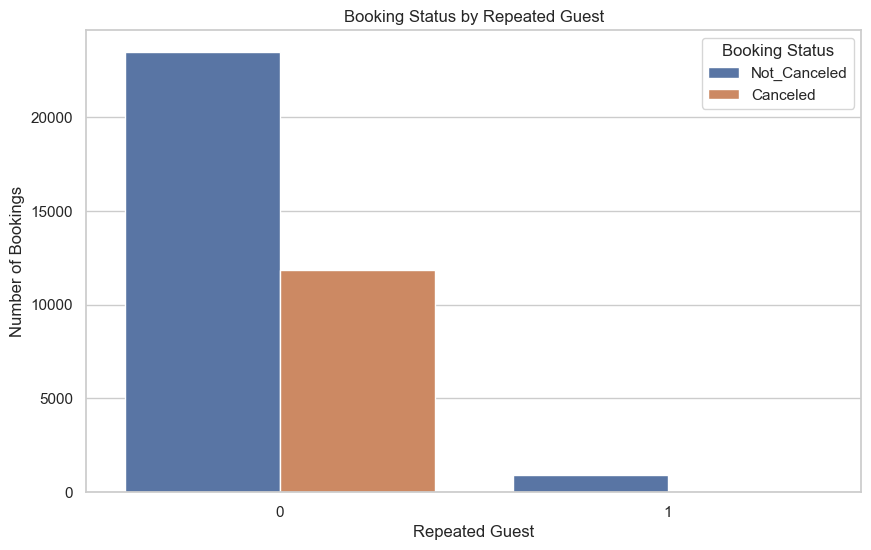

In [23]:
# Booking Status by Repeated Guest
plt.figure(figsize=(10, 6))
sns.countplot(x='repeated_guest', hue='booking_status', data=df)
plt.title('Booking Status by Repeated Guest')
plt.ylabel('Number of Bookings')
plt.xlabel('Repeated Guest')
plt.legend(title='Booking Status')
plt.show()

In [24]:
# Counting the number of previous cancellations
previous_cancellations_count = df['no_of_previous_cancellations'].value_counts().sort_index()

# Displaying the table
previous_cancellations_count_table = previous_cancellations_count.reset_index()
previous_cancellations_count_table.columns = ['Number of Previous Cancellations', 'Count']

print(previous_cancellations_count_table)


   Number of Previous Cancellations  Count
0                                 0  35937
1                                 1    198
2                                 2     46
3                                 3     43
4                                 4     10
5                                 5     11
6                                 6      1
7                                11     25
8                                13      4


In [25]:
import pandas as pd

# Defining the bins for the range
bins = [0, 1, 5, 10, 20, 30, 50, 58]

# Binning the data
binned_data = pd.cut(df['no_of_previous_bookings_not_canceled'], bins, right=False)

# Counting the values in each bin
binned_count = binned_data.value_counts().sort_index()

# Creating a table for display
binned_count_table = binned_count.reset_index()
binned_count_table.columns = ['Range of Previous Bookings Not Canceled', 'Count']

print(binned_count_table)


  Range of Previous Bookings Not Canceled  Count
0                                  [0, 1)  35463
1                                  [1, 5)    485
2                                 [5, 10)    162
3                                [10, 20)     95
4                                [20, 30)     36
5                                [30, 50)     25
6                                [50, 58)      8


In [26]:
# Counting the Booking Status by Number of Special Requests
pd.crosstab(df['no_of_special_requests'], df['booking_status'])

booking_status,Canceled,Not_Canceled
no_of_special_requests,,
0,8545,11232
1,2703,8670
2,637,3727
3,0,675
4,0,78
5,0,8


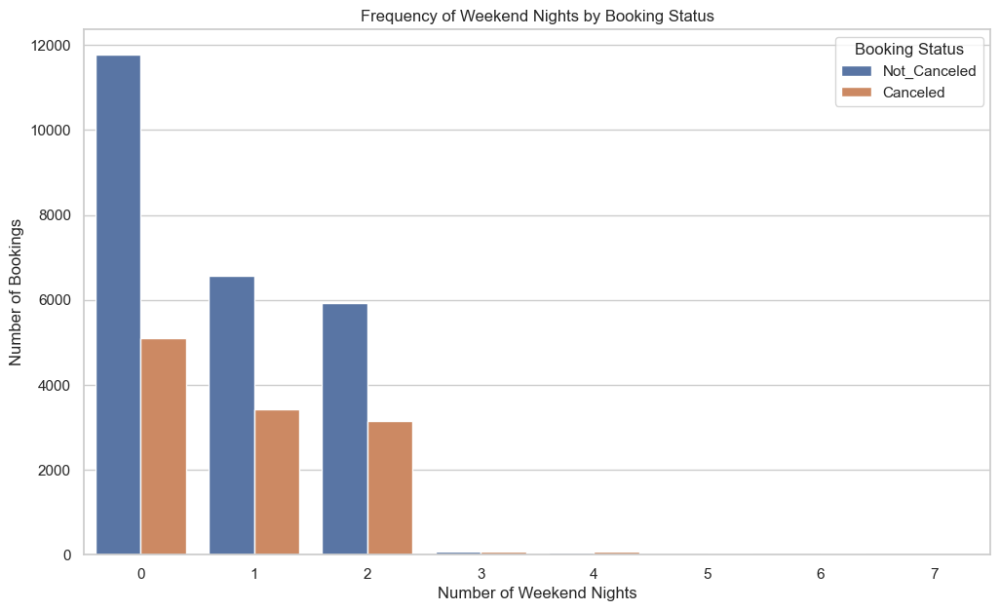

In [27]:
# Creating a chart for the Frequency of Weekend Nights by Booking Status
plt.figure(figsize=(12, 7))
sns.countplot(x='no_of_weekend_nights', hue='booking_status', data=df)
plt.title('Frequency of Weekend Nights by Booking Status')
plt.ylabel('Number of Bookings')
plt.xlabel('Number of Weekend Nights')
plt.legend(title='Booking Status')
plt.show()

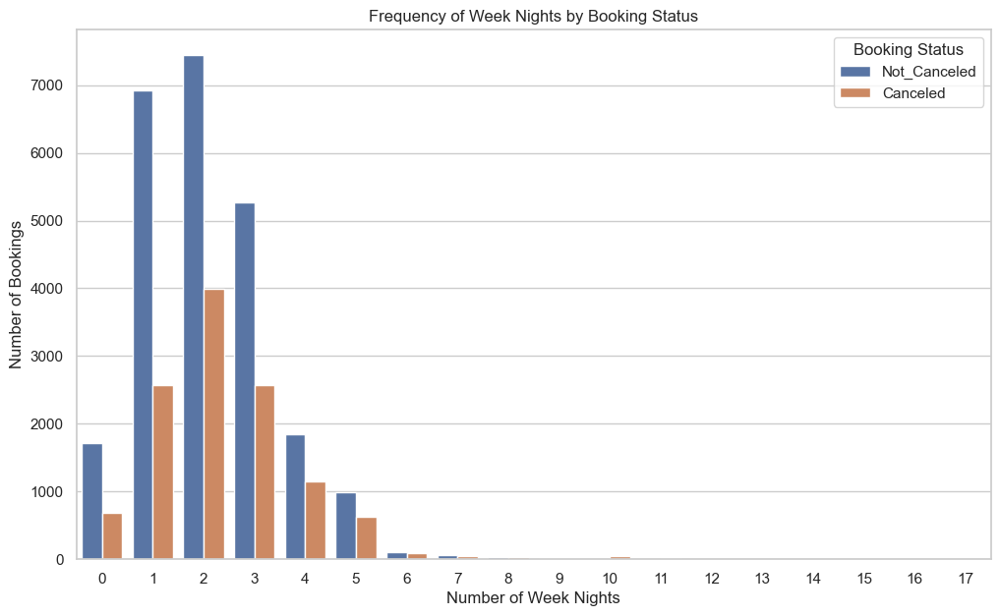

In [28]:
# Creating a chart for the Frequency of Week Nights by Booking Status
plt.figure(figsize=(12, 7))
sns.countplot(x='no_of_week_nights', hue='booking_status', data=df)
plt.title('Frequency of Week Nights by Booking Status')
plt.ylabel('Number of Bookings')
plt.xlabel('Number of Week Nights')
plt.legend(title='Booking Status')
plt.show()

In [29]:
# Describing 'min', 'mean', 'median', 'max', 'std', 'skew' of lead time
lead_time_descriptive_stats = df['lead_time'].agg(['min', 'mean', 'median', 'max', 'std', 'skew'])

lead_time_descriptive_stats

min         0.000000
mean       85.232557
median     57.000000
max       443.000000
std        85.930817
skew        1.292492
Name: lead_time, dtype: float64

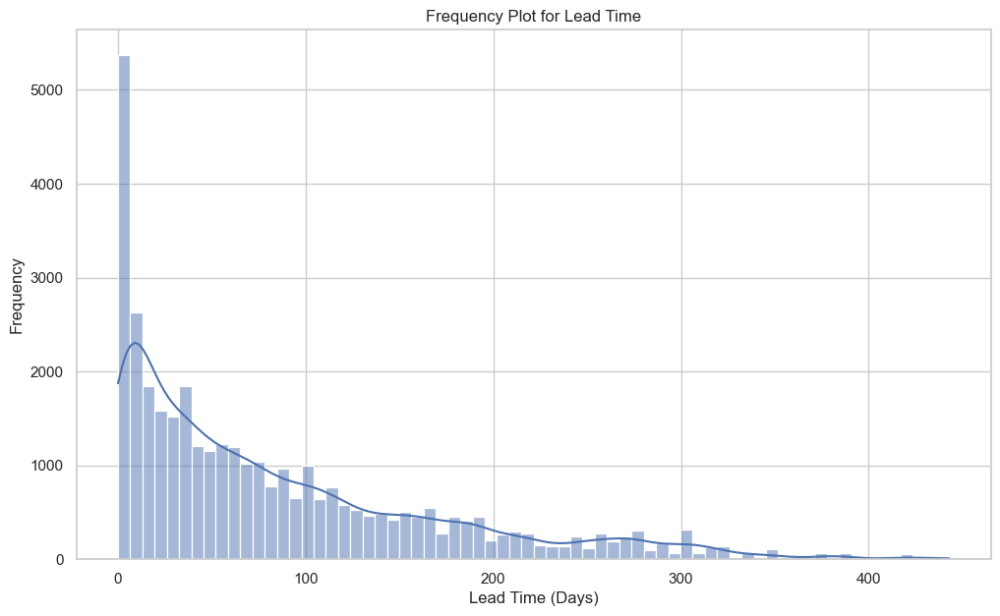

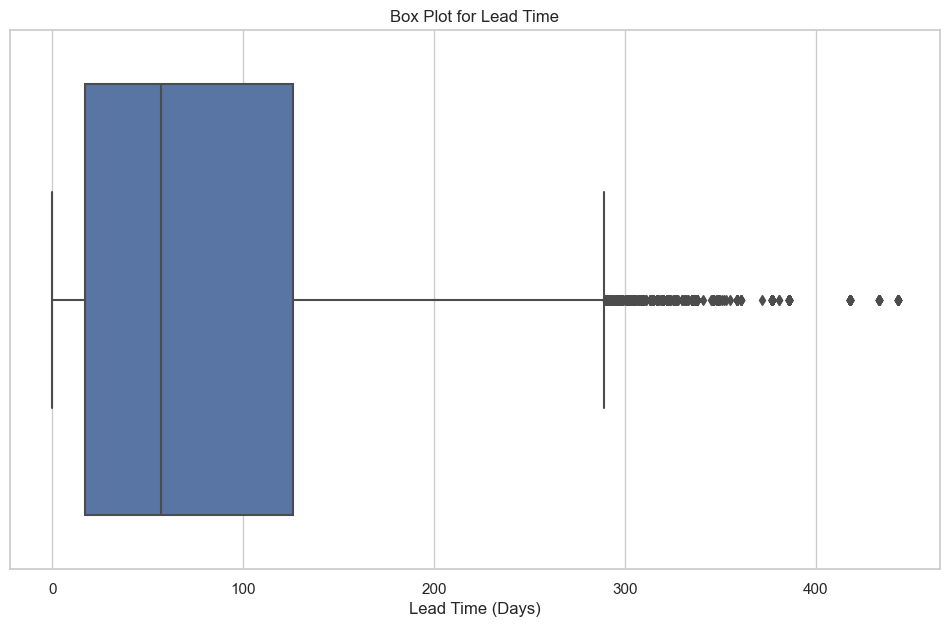

In [30]:
# Creating a Frequency Plot for lead_time
plt.figure(figsize=(12, 7))
sns.histplot(df['lead_time'], kde=True)
plt.title('Frequency Plot for Lead Time')
plt.xlabel('Lead Time (Days)')
plt.ylabel('Frequency')
plt.show()

# Creating a Box Plot for lead_time
plt.figure(figsize=(12, 7))
sns.boxplot(x=df['lead_time'])
plt.title('Box Plot for Lead Time')
plt.xlabel('Lead Time (Days)')
plt.show()



In [31]:
# Calculating descriptive statistics for 'avg_price_per_room'
avg_price_per_room_stats = df['avg_price_per_room'].agg(['min', 'mean', 'median', 'max', 'std', 'skew'])

avg_price_per_room_stats

min         0.000000
mean      103.423539
median     99.450000
max       540.000000
std        35.089424
skew        0.667133
Name: avg_price_per_room, dtype: float64

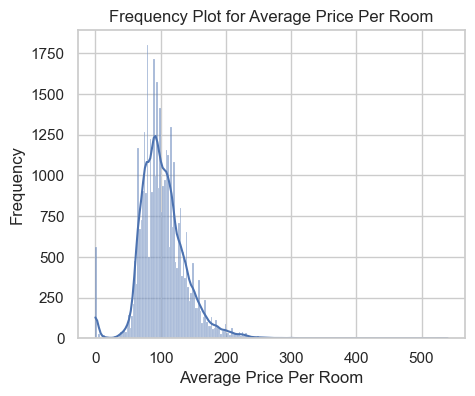

In [32]:
# Creating a Frequency Plot for avg_price_per_room
plt.figure(figsize=(5, 4))
sns.histplot(df['avg_price_per_room'], kde=True)
plt.title('Frequency Plot for Average Price Per Room')
plt.xlabel('Average Price Per Room')
plt.ylabel('Frequency')
plt.show()

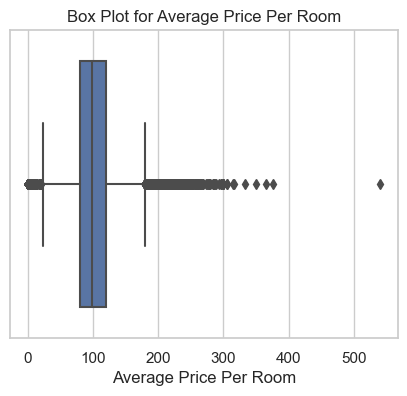

In [33]:
# Creating a Box Plot for avg_price_per_room
plt.figure(figsize=(5, 4))
sns.boxplot(x=df['avg_price_per_room'])
plt.title('Box Plot for Average Price Per Room')
plt.xlabel('Average Price Per Room')
plt.show()

In [34]:
# Function to calculate outliers using IQR
def calculate_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column_name] < lower_bound) | (df[column_name] > upper_bound)]
    return outliers

# Calculating outliers for 'lead_time' and 'avg_price_per_room'
lead_time_outliers = calculate_outliers(df, 'lead_time')
avg_price_per_room_outliers = calculate_outliers(df, 'avg_price_per_room')

# Counting the number of rows containing outliers
num_lead_time_outliers = lead_time_outliers.shape[0]
num_avg_price_per_room_outliers = avg_price_per_room_outliers.shape[0]

num_lead_time_outliers, num_avg_price_per_room_outliers

(1331, 1696)

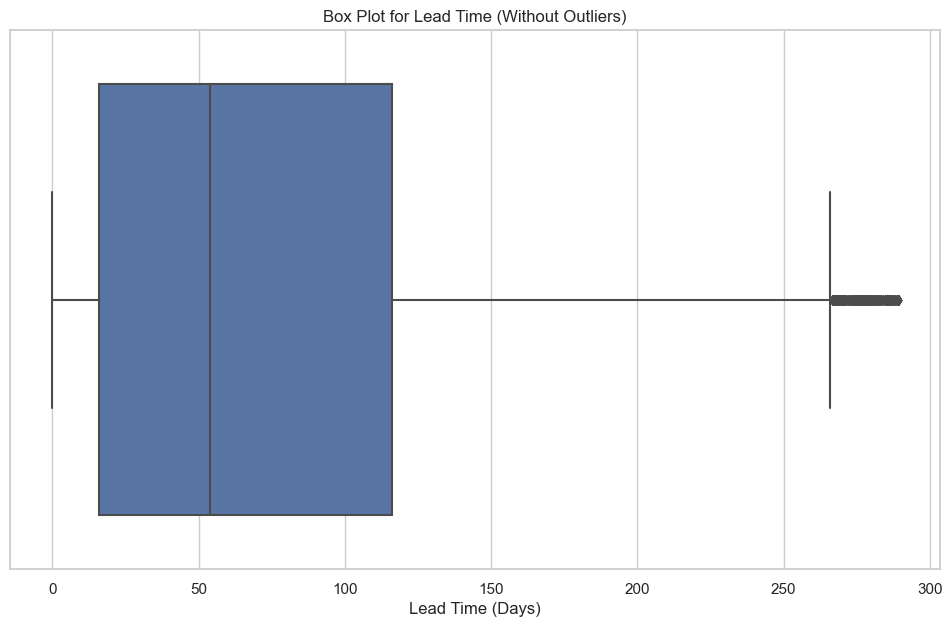

In [35]:
# Removing outliers from 'lead_time'
cleaned_lead_time = calculate_outliers(df, 'lead_time').index
hotel_data_no_lead_time_outliers = df.drop(index=cleaned_lead_time)

# Creating a Box Plot for lead_time without outliers
plt.figure(figsize=(12, 7))
sns.boxplot(x=hotel_data_no_lead_time_outliers['lead_time'])
plt.title('Box Plot for Lead Time (Without Outliers)')
plt.xlabel('Lead Time (Days)')
plt.show()

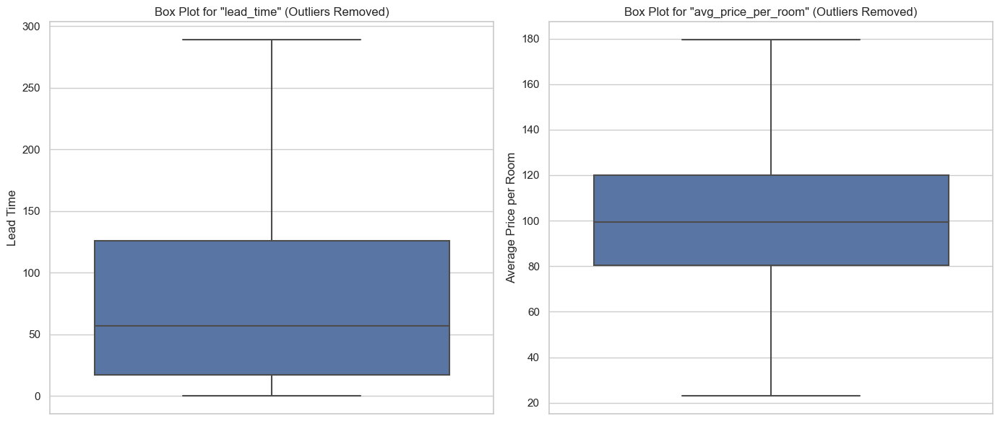

In [36]:
# Following the provided steps to remove outliers and create box plots

# Calculate lower and upper bounds for 'lead_time' outliers
Q1_lead_time = df['lead_time'].quantile(0.25)
Q3_lead_time = df['lead_time'].quantile(0.75)
IQR_lead_time = Q3_lead_time - Q1_lead_time
lower_bound_lead_time = Q1_lead_time - 1.5 * IQR_lead_time
upper_bound_lead_time = Q3_lead_time + 1.5 * IQR_lead_time

# Calculate lower and upper bounds for 'avg_price_per_room' outliers
Q1_avg_price_per_room = df['avg_price_per_room'].quantile(0.25)
Q3_avg_price_per_room = df['avg_price_per_room'].quantile(0.75)
IQR_avg_price_per_room = Q3_avg_price_per_room - Q1_avg_price_per_room
lower_bound_avg_price_per_room = Q1_avg_price_per_room - 1.5 * IQR_avg_price_per_room
upper_bound_avg_price_per_room = Q3_avg_price_per_room + 1.5 * IQR_avg_price_per_room

# Replace outliers in 'lead_time' and 'avg_price_per_room' with the nearest non-outlying values
df.loc[df['lead_time'] < lower_bound_lead_time, 'lead_time'] = Q1_lead_time
df.loc[df['lead_time'] > upper_bound_lead_time, 'lead_time'] = Q3_lead_time
df.loc[df['avg_price_per_room'] < lower_bound_avg_price_per_room, 'avg_price_per_room'] = Q1_avg_price_per_room
df.loc[df['avg_price_per_room'] > upper_bound_avg_price_per_room, 'avg_price_per_room'] = Q3_avg_price_per_room

# Set up subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Box plot for 'lead_time' after removing outliers
sns.boxplot(data=df, y='lead_time', ax=ax1)
ax1.set_title('Box Plot for "lead_time" (Outliers Removed)')
ax1.set_ylabel('Lead Time')

# Box plot for 'avg_price_per_room' after removing outliers
sns.boxplot(data=df, y='avg_price_per_room', ax=ax2)
ax2.set_title('Box Plot for "avg_price_per_room" (Outliers Removed)')
ax2.set_ylabel('Average Price per Room')

plt.tight_layout()
plt.show()

In [37]:
# Aggregating data by arrival year
yearly_data = df.groupby('arrival_year').agg(
    Total_Bookings=pd.NamedAgg(column="Booking_ID", aggfunc="count"),
    Average_Lead_Time=pd.NamedAgg(column="lead_time", aggfunc="mean"),
    Average_Price_Per_Room=pd.NamedAgg(column="avg_price_per_room", aggfunc="mean")
).reset_index()

yearly_data

,arrival_year,Total_Bookings,Average_Lead_Time,Average_Price_Per_Room
0,2017,6514,58.371815,91.700936
1,2018,29761,82.006821,104.552339


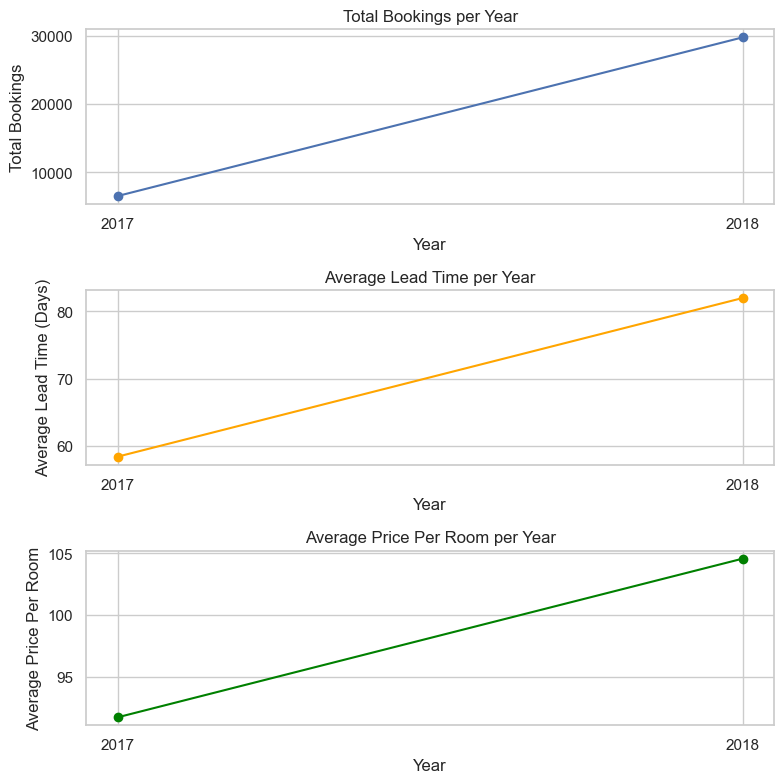

In [38]:
import matplotlib.ticker as ticker

# Setting up the figure for multiple plots
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 8))

# Plot for Total Bookings per Year
axes[0].plot(yearly_data['arrival_year'], yearly_data['Total_Bookings'], marker='o')
axes[0].set_title('Total Bookings per Year')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Total Bookings')
axes[0].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

# Plot for Average Lead Time per Year
axes[1].plot(yearly_data['arrival_year'], yearly_data['Average_Lead_Time'], marker='o', color='orange')
axes[1].set_title('Average Lead Time per Year')
axes[1].set_xlabel('Year')
axes[1].set_ylabel('Average Lead Time (Days)')
axes[1].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

# Plot for Average Price Per Room per Year
axes[2].plot(yearly_data['arrival_year'], yearly_data['Average_Price_Per_Room'], marker='o', color='green')
axes[2].set_title('Average Price Per Room per Year')
axes[2].set_xlabel('Year')
axes[2].set_ylabel('Average Price Per Room')
axes[2].xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

plt.tight_layout()
plt.show()



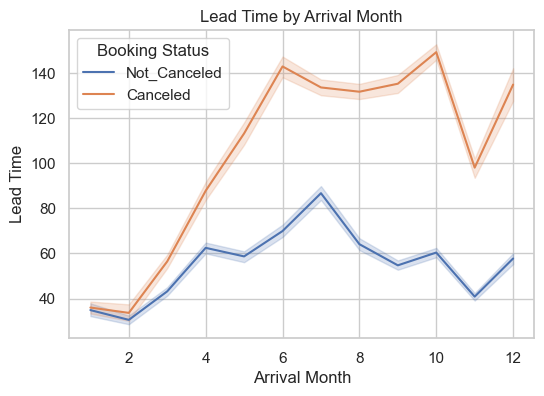

In [39]:
##### Creating the line chart for Lead Time by Arrival Month with hue based on booking status
plt.figure(figsize=(6, 4))
sns.lineplot(data=df, x='arrival_month', y='lead_time', hue='booking_status')
plt.title('Lead Time by Arrival Month')
plt.xlabel('Arrival Month')
plt.ylabel('Lead Time')
plt.grid(True)
plt.legend(title='Booking Status', loc='upper left')
plt.show()

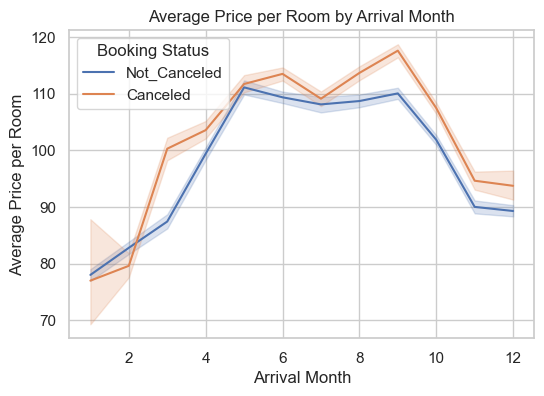

In [40]:
# Creating the line chart for Average Price per Room by Arrival Month with hue based on booking status
plt.figure(figsize=(6, 4))
sns.lineplot(data=df, x='arrival_month', y='avg_price_per_room', hue='booking_status')
plt.title('Average Price per Room by Arrival Month')
plt.xlabel('Arrival Month')
plt.ylabel('Average Price per Room')
plt.grid(True)
plt.legend(title='Booking Status', loc='upper left')
plt.show()

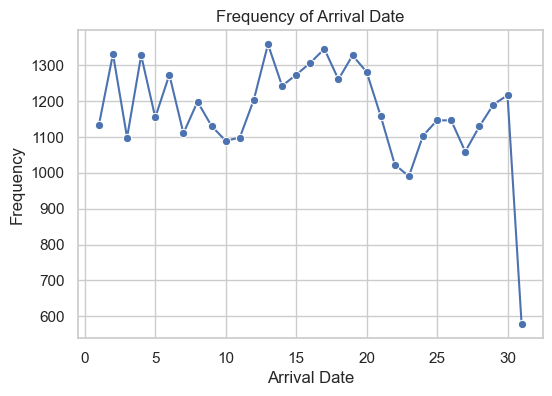

In [41]:
# Calculate the frequency of each arrival date
arrival_date_frequency = df['arrival_date'].value_counts().sort_index()

# Create a line chart with markers
plt.figure(figsize=(6, 4))
sns.lineplot(x=arrival_date_frequency.index, y=arrival_date_frequency.values, marker='o')
plt.title('Frequency of Arrival Date')
plt.xlabel('Arrival Date')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

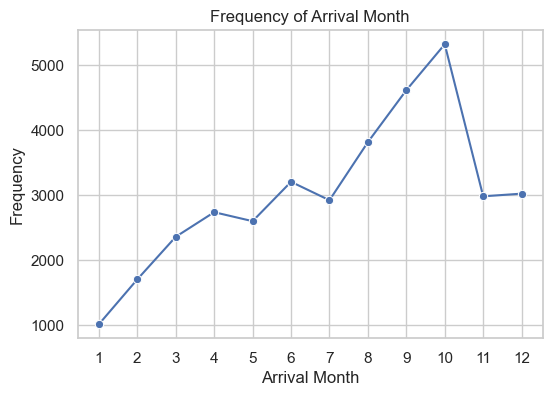

In [42]:
# Calculate the frequency of each arrival month
arrival_month_frequency = df['arrival_month'].value_counts().sort_index()

# Create a line chart with markers
plt.figure(figsize=(6, 4))
sns.lineplot(x=arrival_month_frequency.index, y=arrival_month_frequency.values, marker='o')
plt.title('Frequency of Arrival Month')
plt.xlabel('Arrival Month')
plt.ylabel('Frequency')
plt.xticks(range(1, 13))  # Setting x-axis ticks for each month
plt.grid(True)
plt.show()


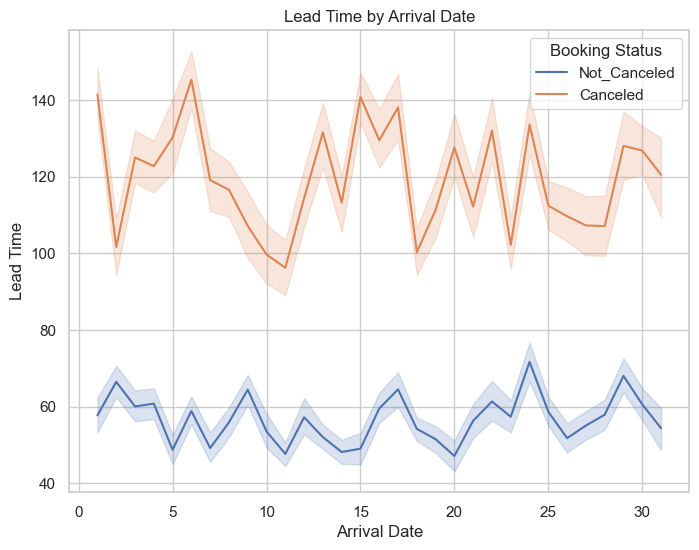

In [43]:
# Create the line chart for Lead Time by Arrival Date with hue based on booking status
plt.figure(figsize=(8, 6))
sns.lineplot(data=df, x='arrival_date', y='lead_time', hue='booking_status')
plt.title('Lead Time by Arrival Date')
plt.xlabel('Arrival Date')
plt.ylabel('Lead Time')
plt.grid(True)
plt.legend(title='Booking Status')
plt.show()

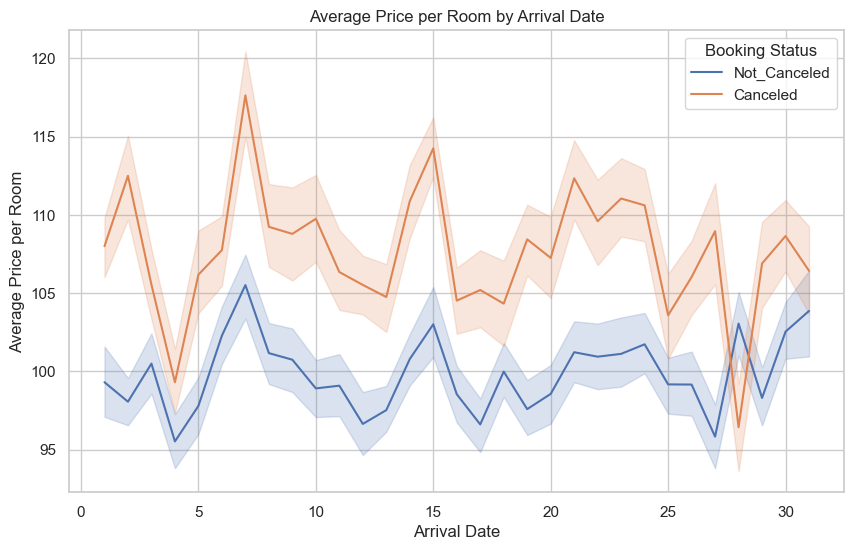

In [44]:
# Create the line chart for Average Price per Room by Arrival Date with hue based on booking status
plt.figure(figsize=(10, 6))
sns.lineplot(data=df, x='arrival_date', y='avg_price_per_room', hue='booking_status')
plt.title('Average Price per Room by Arrival Date')
plt.xlabel('Arrival Date')
plt.ylabel('Average Price per Room')
plt.grid(True)
plt.legend(title='Booking Status', loc='upper right')
plt.show()

In [45]:
from scipy.stats import chi2_contingency
# Creating a contingency table for 'type_of_meal_plan' and 'booking_status'
contingency_table = pd.crosstab(df['type_of_meal_plan'], df['booking_status'])

# Performing the Chi-Squared test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# chi2 is the Chi-Squared statistic
# p is the p-value of the test
print("Chi-Squared Statistic:", chi2)
print("p-value:", p)

Chi-Squared Statistic: 278.29490920586017
p-value: 4.951915406087789e-60


In [46]:
# Creating a contingency table for 'room_type_reserved' and 'booking_status'
contingency_table_room_booking = pd.crosstab(df['room_type_reserved'], df['booking_status'])

# Performing the Chi-Squared test
chi2_room_booking, p_room_booking, dof_room_booking, expected_room_booking = chi2_contingency(contingency_table_room_booking)

# chi2_room_booking is the Chi-Squared statistic
# p_room_booking is the p-value of the test
print("Chi-Squared Statistic:", chi2_room_booking)
print("p-value:", p_room_booking)

Chi-Squared Statistic: 57.33495179790707
p-value: 1.5627796772447482e-10


In [47]:
# Creating a contingency table for 'market_segment_type' and 'booking_status'
contingency_table_market_booking = pd.crosstab(df['market_segment_type'], df['booking_status'])

# Performing the Chi-Squared test
chi2_market_booking, p_market_booking, dof_market_booking, expected_market_booking = chi2_contingency(contingency_table_market_booking)

# chi2_market_booking is the Chi-Squared statistic
# p_market_booking is the p-value of the test
print("Chi-Squared Statistic:", chi2_market_booking)
print("p-value:", p_market_booking)

Chi-Squared Statistic: 814.108865240557
p-value: 6.748763024557236e-175


In [48]:
df = df.drop(['arrival_year', 'arrival_month', 'arrival_date', "no_of_week_nights", "no_of_weekend_nights"], axis=1)
df.head()

,Booking_ID,no_of_adults,no_of_children,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,Not Selected,0,Room_Type 1,5,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,Meal Plan 1,0,Room_Type 1,1,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,Not Selected,0,Room_Type 1,48,Online,0,0,0,94.50,0,Canceled


In [49]:
# First, let's see the unique values in the 'type_of_meal_plan' column
unique_meal_plans = df['type_of_meal_plan'].unique()
print("Unique Meal Plans:", unique_meal_plans)

# Creating a mapping dictionary
meal_plan_mapping = {meal_plan: idx for idx, meal_plan in enumerate(unique_meal_plans)}
print("Meal Plan Mapping:", meal_plan_mapping)

# Applying the mapping to the DataFrame
df['meal_plan_mapped'] =df['type_of_meal_plan'].map(meal_plan_mapping)

# Displaying the first few rows to verify the mapping
print(df[['type_of_meal_plan', 'meal_plan_mapped']].head())


Unique Meal Plans: ['Meal Plan 1' 'Not Selected' 'Meal Plan 2' 'Meal Plan 3']
Meal Plan Mapping: {'Meal Plan 1': 0, 'Not Selected': 1, 'Meal Plan 2': 2, 'Meal Plan 3': 3}
  type_of_meal_plan  meal_plan_mapped
0       Meal Plan 1                 0
1      Not Selected                 1
2       Meal Plan 1                 0
3       Meal Plan 1                 0
4      Not Selected                 1


In [50]:

unique_market_segments = df['market_segment_type'].unique()
print("Unique Market Segments:", unique_market_segments)

# Creating a mapping dictionary
market_segment_mapping = {segment: idx for idx, segment in enumerate(unique_market_segments)}
print("Market Segment Mapping:", market_segment_mapping)

# Applying the mapping to the DataFrame
df['market_segment_mapped'] = df['market_segment_type'].map(market_segment_mapping)

# Displaying the first few rows to verify the mapping
print(df[['market_segment_type', 'market_segment_mapped']].head())


Unique Market Segments: ['Offline' 'Online' 'Corporate' 'Aviation' 'Complementary']
Market Segment Mapping: {'Offline': 0, 'Online': 1, 'Corporate': 2, 'Aviation': 3, 'Complementary': 4}
  market_segment_type  market_segment_mapped
0             Offline                      0
1              Online                      1
2              Online                      1
3              Online                      1
4              Online                      1


In [51]:

# Replacing 'Non_Canceled' with 0 and 'Canceled' with 1 in the 'booking_status' column
df['booking_status'] = df['booking_status'].replace({'Not_Canceled': 0, 'Canceled': 1})

# Displaying the first few rows to verify the changes
print(df[['booking_status']].head())

   booking_status
0               0
1               0
2               1
3               1
4               1


In [52]:
# First, extract the unique room types
unique_room_types = df['room_type_reserved'].unique()

# Creating a mapping from numerical values to room types
room_type_numerical_mapping = {i: room_type for i, room_type in enumerate(unique_room_types)}

# Displaying the mapping
print("Room Type Numerical Mapping:", room_type_numerical_mapping)


Room Type Numerical Mapping: {0: 'Room_Type 1', 1: 'Room_Type 4', 2: 'Room_Type 2', 3: 'Room_Type 6', 4: 'Room_Type 5', 5: 'Room_Type 7', 6: 'Room_Type 3'}


In [53]:
# Exclude non-numeric columns
numeric_columns = df.select_dtypes(include=[np.number])

# Calculating the correlation matrix for numeric columns only
correlation_matrix = numeric_columns.corr()

# Displaying the correlation matrix
print(correlation_matrix)


                                      no_of_adults  no_of_children  \
no_of_adults                              1.000000       -0.019787   
no_of_children                           -0.019787        1.000000   
required_car_parking_space                0.011429        0.034244   
lead_time                                 0.111223       -0.033118   
repeated_guest                           -0.192277       -0.036348   
no_of_previous_cancellations             -0.047426       -0.016390   
no_of_previous_bookings_not_canceled     -0.119166       -0.021189   
avg_price_per_room                        0.294192        0.214525   
no_of_special_requests                    0.189401        0.124486   
booking_status                            0.086920        0.033078   
meal_plan_mapped                          0.027698       -0.067543   
market_segment_mapped                    -0.095543        0.073159   

                                      required_car_parking_space  lead_time  \
no_of_adul

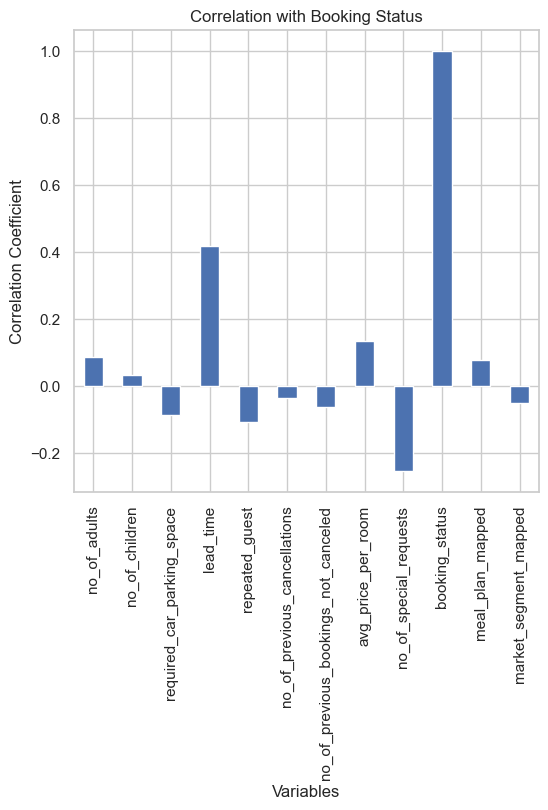

In [54]:
import matplotlib.pyplot as plt

# Assuming you have already calculated the correlation matrix named 'correlation_matrix'
# Extracting correlation values with 'booking_status'
correlation_with_booking_status = correlation_matrix['booking_status'] 

# Creating a bar plot
plt.figure(figsize=(6, 6))
correlation_with_booking_status.plot(kind='bar')
plt.title('Correlation with Booking Status')
plt.xlabel('Variables')
plt.ylabel('Correlation Coefficient')
plt.grid(True)
plt.show()


In [69]:
# Identify categorical columns in the dataset
categorical_cols = df.select_dtypes(include=['object', 'category']).columns

# Create mappings for each categorical column
mappings = {col: {n: cat for n, cat in enumerate(df[col].astype('category').cat.categories)} for col in categorical_cols}

mappings


{'Booking_ID': {0: 'INN00001',
  1: 'INN00002',
  2: 'INN00003',
  3: 'INN00004',
  4: 'INN00005',
  5: 'INN00006',
  6: 'INN00007',
  7: 'INN00008',
  8: 'INN00009',
  9: 'INN00010',
  10: 'INN00011',
  11: 'INN00012',
  12: 'INN00013',
  13: 'INN00014',
  14: 'INN00015',
  15: 'INN00016',
  16: 'INN00017',
  17: 'INN00018',
  18: 'INN00019',
  19: 'INN00020',
  20: 'INN00021',
  21: 'INN00022',
  22: 'INN00023',
  23: 'INN00024',
  24: 'INN00025',
  25: 'INN00026',
  26: 'INN00027',
  27: 'INN00028',
  28: 'INN00029',
  29: 'INN00030',
  30: 'INN00031',
  31: 'INN00032',
  32: 'INN00033',
  33: 'INN00034',
  34: 'INN00035',
  35: 'INN00036',
  36: 'INN00037',
  37: 'INN00038',
  38: 'INN00039',
  39: 'INN00040',
  40: 'INN00041',
  41: 'INN00042',
  42: 'INN00043',
  43: 'INN00044',
  44: 'INN00045',
  45: 'INN00046',
  46: 'INN00047',
  47: 'INN00048',
  48: 'INN00049',
  49: 'INN00050',
  50: 'INN00051',
  51: 'INN00052',
  52: 'INN00053',
  53: 'INN00054',
  54: 'INN00055',
  55: 

In [71]:
# Drop the 'Booking_ID' column from the dataset
data_dropped = df.drop('Booking_ID', axis=1)

# Display the first 10 rows of the modified dataset
data_dropped.head(10)


,no_of_adults,no_of_children,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,meal_plan_mapped,market_segment_mapped,booking_status_mapped
0,2,0,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,65.00,0,0,0,0,0
1,2,0,Not Selected,0,Room_Type 1,5,Online,0,0,0,106.68,1,0,1,1,0
2,1,0,Meal Plan 1,0,Room_Type 1,1,Online,0,0,0,60.00,0,1,0,1,1
3,2,0,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.00,0,1,0,1,1
4,2,0,Not Selected,0,Room_Type 1,48,Online,0,0,0,94.50,0,1,1,1,1
5,2,0,Meal Plan 2,0,Room_Type 1,126,Online,0,0,0,115.00,1,1,2,1,1
6,2,0,Meal Plan 1,0,Room_Type 1,34,Online,0,0,0,107.55,1,0,0,1,0
7,2,0,Meal Plan 1,0,Room_Type 4,83,Online,0,0,0,105.61,1,0,0,1,0
8,3,0,Meal Plan 1,0,Room_Type 1,121,Offline,0,0,0,96.90,1,0,0,0,0
9,2,0,Meal Plan 1,0,Room_Type 4,44,Online,0,0,0,133.44,3,0,0,1,0


In [75]:
# First, let's find the unique room types
unique_room_types = df['room_type_reserved'].unique()

# Now, create a mapping from numerical values to these room types
room_type_mapping = {num: room_type for num, room_type in enumerate(unique_room_types)}

# Displaying the mapping
print("Room Type Mapping:", room_type_mapping)


Room Type Mapping: {0: 'Room_Type 1', 1: 'Room_Type 4', 2: 'Room_Type 2', 3: 'Room_Type 6', 4: 'Room_Type 5', 5: 'Room_Type 7', 6: 'Room_Type 3'}


In [76]:
# Creating mapping for 'market_segment_type'
market_segment_types = df['market_segment_type'].unique()
market_segment_mapping = {segment: idx for idx, segment in enumerate(market_segment_types)}
print("Market Segment Mapping:", market_segment_mapping)

# Applying the mapping to the 'market_segment_type' column
df['market_segment_mapped'] = df['market_segment_type'].map(market_segment_mapping)

# Creating mapping for 'booking_status' (assuming it's categorical like 'Canceled', 'Not_Canceled')
booking_statuses = df['booking_status'].unique()
booking_status_mapping = {status: idx for idx, status in enumerate(booking_statuses)}
print("Booking Status Mapping:", booking_status_mapping)

# Applying the mapping to the 'booking_status' column
df['booking_status_mapped'] = df['booking_status'].map(booking_status_mapping)

# Displaying the first few rows to verify the mappings
df[['market_segment_type', 'market_segment_mapped', 'booking_status', 'booking_status_mapped']].head()


Market Segment Mapping: {'Offline': 0, 'Online': 1, 'Corporate': 2, 'Aviation': 3, 'Complementary': 4}
Booking Status Mapping: {0: 0, 1: 1}


,market_segment_type,market_segment_mapped,booking_status,booking_status_mapped
0,Offline,0,0,0
1,Online,1,0,0
2,Online,1,1,1
3,Online,1,1,1
4,Online,1,1,1


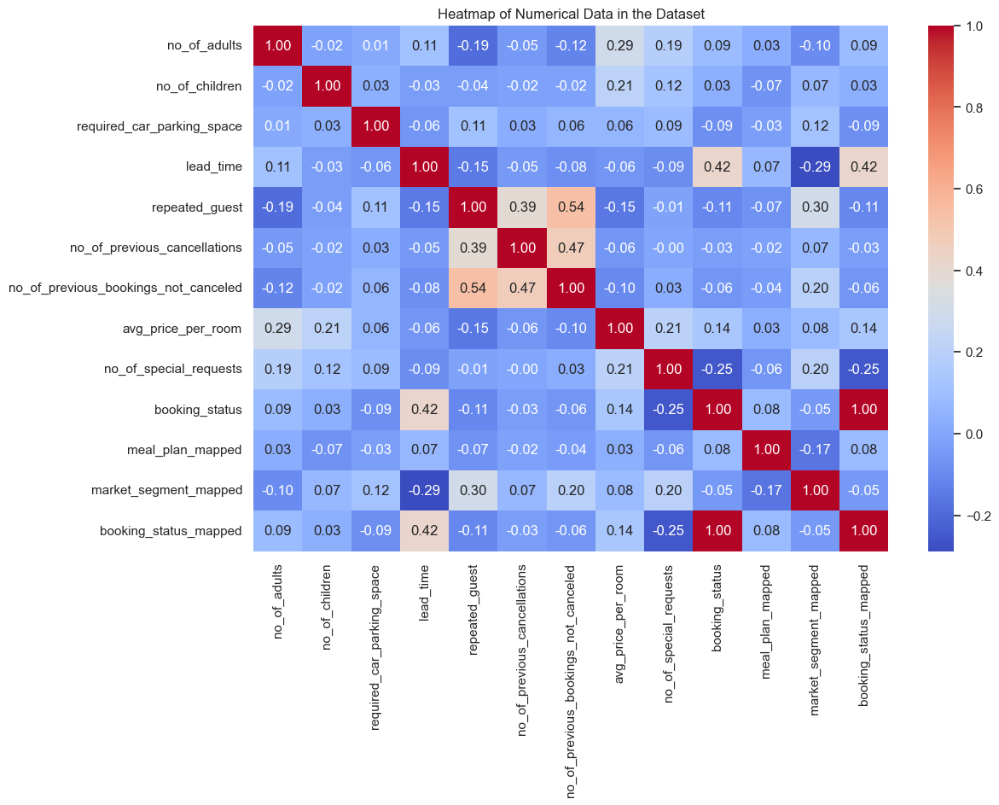

In [78]:
# Select only numerical columns for the heatmap
numerical_data = df.select_dtypes(include=['int64', 'float64'])

# Generate a heatmap for the numerical data
plt.figure(figsize=(12, 8))
sns.heatmap(numerical_data.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Heatmap of Numerical Data in the Dataset')
plt.show()


In [93]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Dropping the 'Booking_ID' column as it's a unique identifier
data_processed = df.drop('Booking_ID', axis=1)

# Encoding categorical columns
label_encoders = {}
for column in data_processed.select_dtypes(include=['object', 'category']).columns:
    label_encoders[column] = LabelEncoder()
    data_processed[column] = label_encoders[column].fit_transform(data_processed[column])

# Splitting the data into features and target
X = data_processed.drop('booking_status', axis=1)
y = data_processed['booking_status']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape


((29020, 15), (7255, 15), (29020,), (7255,))

In [94]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

# Train the Decision Tree model
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train, y_train)

# Predict on test data
y_pred_dt = decision_tree.predict(X_test)

# Evaluate the Decision Tree model
accuracy_dt = accuracy_score(y_test, y_pred_dt)
classification_report_dt = classification_report(y_test, y_pred_dt)

accuracy_dt, classification_report_dt



(1.0,
 '              precision    recall  f1-score   support\n\n           0       1.00      1.00      1.00      4839\n           1       1.00      1.00      1.00      2416\n\n    accuracy                           1.00      7255\n   macro avg       1.00      1.00      1.00      7255\nweighted avg       1.00      1.00      1.00      7255\n')

In [95]:
# Hyperparameter tuning using Grid Search
param_grid = {
    'max_depth': [10, 15, 20, None],
    'min_samples_leaf': [1, 2, 4],
    'min_samples_split': [2, 5, 10]
}

# Grid Search with cross-validation
grid_search = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42), 
                           param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

best_params, best_score

({'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}, 1.0)

In [96]:
from sklearn.model_selection import GridSearchCV

# Re-running Grid Search with cross-validation
grid_search = GridSearchCV(estimator=DecisionTreeClassifier(random_state=42), 
                           param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

best_params, best_score




({'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}, 1.0)

In [97]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize models
models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "KNN": KNeighborsClassifier()
}

# Dictionary to hold evaluation metrics
metrics = {
    "Model": [],
    "Accuracy": [],
    "Precision": [],
    "Recall": [],
    "F1 Score": []
}

# Train and evaluate each model
for model_name, model in models.items():
    # Fit model
    model.fit(X_train, y_train)

    # Predict on test data
    y_pred = model.predict(X_test)

    # Calculate metrics
    metrics["Model"].append(model_name)
    metrics["Accuracy"].append(accuracy_score(y_test, y_pred))
    metrics["Precision"].append(precision_score(y_test, y_pred, average='weighted'))
    metrics["Recall"].append(recall_score(y_test, y_pred, average='weighted'))
    metrics["F1 Score"].append(f1_score(y_test, y_pred, average='weighted'))

# Convert metrics to a DataFrame for display
metrics_df = pd.DataFrame(metrics)
metrics_df



,Model,Accuracy,Precision,Recall,F1 Score
0,Random Forest,1.000000,1.000000,1.000000,1.000000
1,Decision Tree,1.000000,1.000000,1.000000,1.000000
2,Logistic Regression,1.000000,1.000000,1.000000,1.000000
3,KNN,0.860648,0.859013,0.860648,0.858044


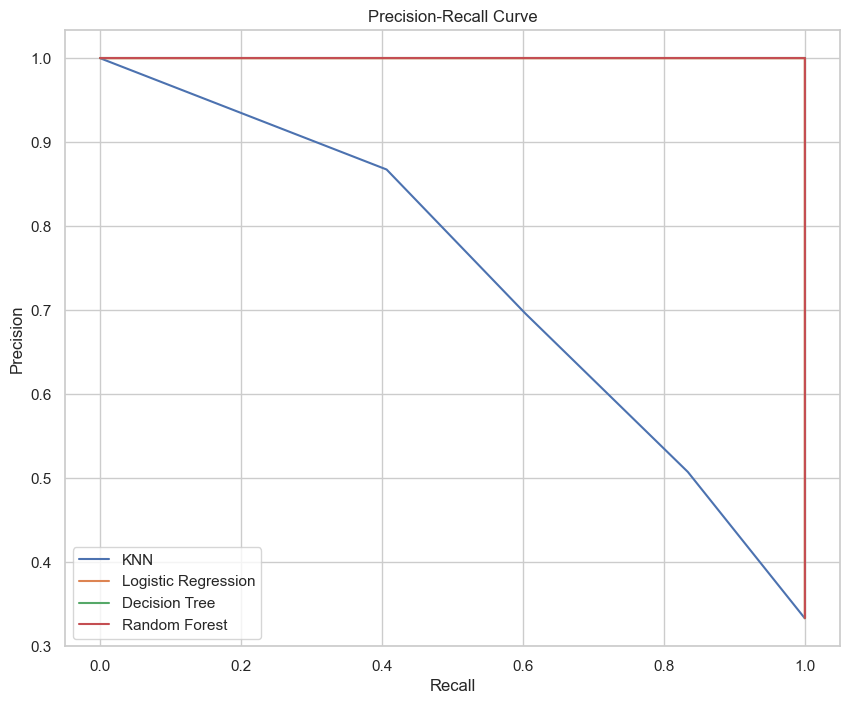

In [104]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Train the KNN model on a reduced dataset to manage memory issues
knn_reduced = KNeighborsClassifier(n_neighbors=3)
X_train_reduced = X_train.sample(frac=0.1, random_state=42)
y_train_reduced = y_train.loc[X_train_reduced.index]
knn_reduced.fit(X_train_reduced, y_train_reduced)

# Predict probabilities for the test set for each model
y_scores_knn = knn_reduced.predict_proba(X_test)[:, 1]
y_scores_log_reg = models['Logistic Regression'].predict_proba(X_test)[:, 1]
y_scores_decision_tree = models['Decision Tree'].predict_proba(X_test)[:, 1]
y_scores_random_forest = models['Random Forest'].predict_proba(X_test)[:, 1]

# Compute Precision-Recall values for each model
precision_knn, recall_knn, _ = precision_recall_curve(y_test, y_scores_knn)
precision_log_reg, recall_log_reg, _ = precision_recall_curve(y_test, y_scores_log_reg)
precision_decision_tree, recall_decision_tree, _ = precision_recall_curve(y_test, y_scores_decision_tree)
precision_random_forest, recall_random_forest, _ = precision_recall_curve(y_test, y_scores_random_forest)

# Plotting Precision-Recall curves
plt.figure(figsize=(10, 8))
plt.plot(recall_knn, precision_knn, label='KNN')
plt.plot(recall_log_reg, precision_log_reg, label='Logistic Regression')
plt.plot(recall_decision_tree, precision_decision_tree, label='Decision Tree')
plt.plot(recall_random_forest, precision_random_forest, label='Random Forest')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()


In [136]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
random_forest = RandomForestClassifier(random_state=42)
random_forest.fit(X_train, y_train)

plt.figure(figsize=(8, 8))
plt.savefig('Random_Forest_Tree.pdf')
plt.show()


<Figure size 800x800 with 0 Axes>

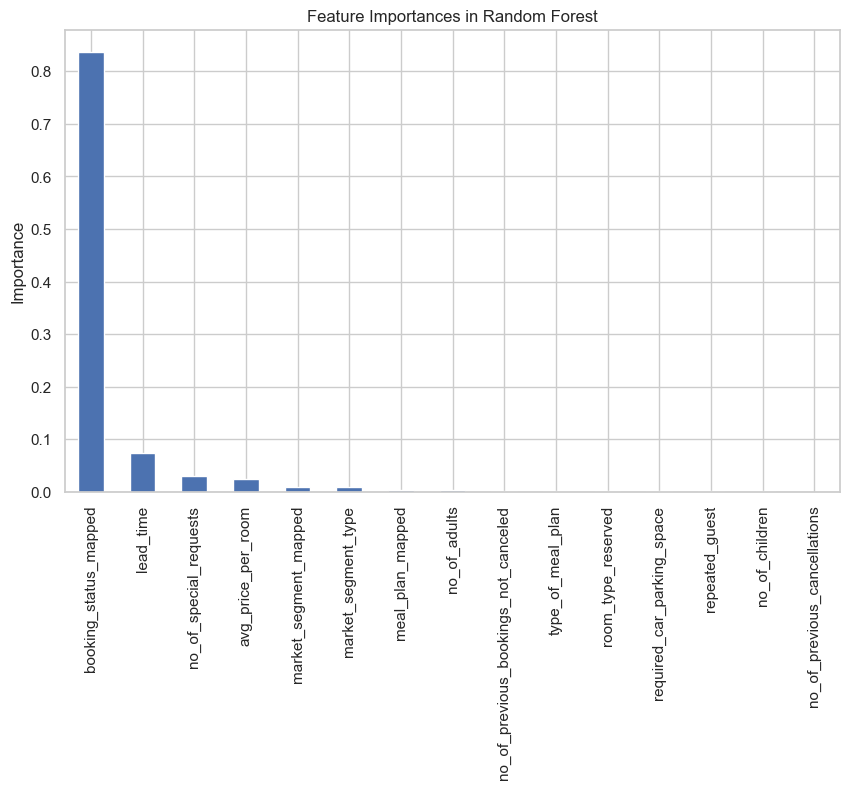

In [138]:
import pandas as pd

feature_importances = pd.Series(random_forest.feature_importances_, index=X_train.columns)
feature_importances = feature_importances.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
feature_importances.plot(kind='bar')
plt.title('Feature Importances in Random Forest')
plt.ylabel('Importance')
plt.savefig('Random_Forest_Feature_Importances.pdf')
plt.show()


In [112]:
feature_importances = random_forest.feature_importances_
features_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)
print(features_df)

                                 Feature  Importance
14                 booking_status_mapped    0.837010
5                              lead_time    0.074512
11                no_of_special_requests    0.030886
10                    avg_price_per_room    0.023928
13                 market_segment_mapped    0.009466
6                    market_segment_type    0.009088
12                      meal_plan_mapped    0.003055
0                           no_of_adults    0.003021
9   no_of_previous_bookings_not_canceled    0.001975
2                      type_of_meal_plan    0.001822
4                     room_type_reserved    0.001625
3             required_car_parking_space    0.001602
7                         repeated_guest    0.001112
1                         no_of_children    0.000723
8           no_of_previous_cancellations    0.000175


In [113]:
y_pred_rf = random_forest.predict(X_test)


In [115]:
import pandas as pd

results_df = pd.DataFrame({
    'Actual Label': y_test,
    'Predicted Label': y_pred_rf
})
print(results_df.head())


       Actual Label  Predicted Label
4968              0                0
34540             0                0
36108             0                0
1553              1                1
24974             0                0


In [121]:
from sklearn.tree import DecisionTreeClassifier

# Decision Tree using Gini Impurity
dt_gini = DecisionTreeClassifier(criterion='gini', random_state=42, max_depth=3)
dt_gini.fit(X_train, y_train)

# Decision Tree using Entropy
dt_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42, max_depth=3)
dt_entropy.fit(X_train, y_train)


DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=42)

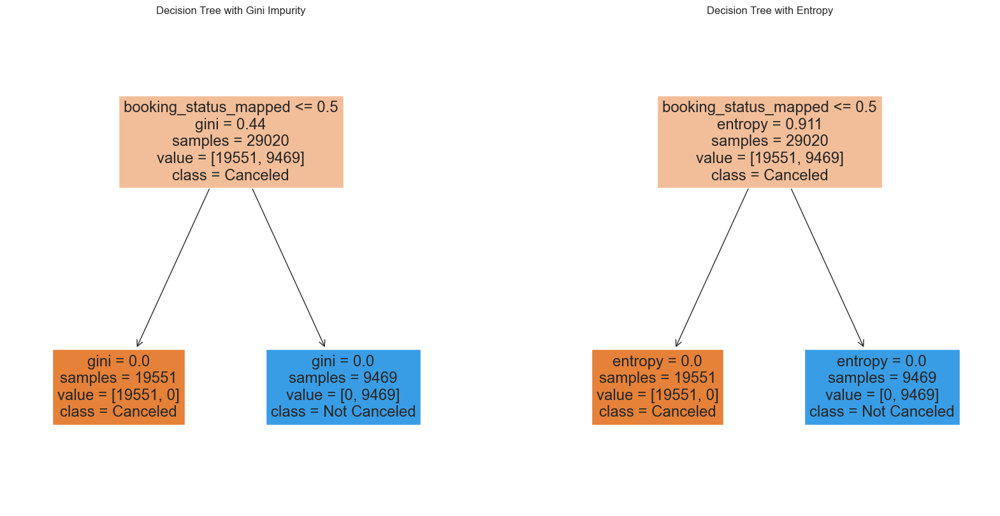

<Figure size 640x480 with 0 Axes>

In [127]:
# Convert DataFrame columns to a list
feature_names_list = X_train.columns.tolist()

# Now use this list for the feature_names parameter
plt.figure(figsize=(20, 10))

# Gini Impurity model
plt.subplot(1, 2, 1)
plot_tree(dt_gini, filled=True, feature_names=feature_names_list, class_names=['Canceled', 'Not Canceled'])
plt.title('Decision Tree with Gini Impurity')

# Entropy model
plt.subplot(1, 2, 2)
plot_tree(dt_entropy, filled=True, feature_names=feature_names_list, class_names=['Canceled', 'Not Canceled'])
plt.title('Decision Tree with Entropy')

plt.show()
plt.savefig('Decision_Tree_Gini.pdf')
plt.show()
plt.close()
